In [62]:
import pandas as pd
from Bio import SeqIO
from Bio import AlignIO
import os
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.offline as py
import plotly.graph_objs as go
from plotly import tools
%matplotlib inline
py.init_notebook_mode(connected=True)

In [3]:
df = pd.read_table('/Users/hq/Documents/data/jerboa/total_variants.tsv', header=0, keep_default_na=False,
                   dtype={'Start': int, 'End': int, 'Ref': str, 'Alt': str, "Orthologous species": str,
                          'Jaculus_jaculus protein': str, 'Orthologous protein': str, 
                          'Identity': float, 'Type': str, 'Provean': str})
df_score = pd.read_table('/Users/hq/Documents/data/jerboa/total_variants.tsv', header=0, usecols=['Provean'],
                   dtype={'Provean': float})
df['Provean'] = df_score['Provean']
df.head(5)

,Start,End,Ref,Alt,Orthologous species,Jaculus_jaculus protein,Orthologous protein,Identity,Type,Provean
0,29,29,A,V,Nannospalax_galili,ENSJJAP00000010891,ENSNGAP00000025991,0.914,sub,0.457
1,31,32,GD,RE,Nannospalax_galili,ENSJJAP00000010891,ENSNGAP00000025991,0.914,delins,1.444
2,37,37,R,A,Nannospalax_galili,ENSJJAP00000010891,ENSNGAP00000025991,0.914,sub,-1.090
3,40,40,S,G,Nannospalax_galili,ENSJJAP00000010891,ENSNGAP00000025991,0.914,sub,-1.270
4,42,42,D,E,Nannospalax_galili,ENSJJAP00000010891,ENSNGAP00000025991,0.914,sub,-1.189


In [14]:
# add rich info
gene_info_df = pd.read_table('/Users/hq/Documents/data/jerboa/ortho_total.tsv')
jerboa_fasta_dict = SeqIO.to_dict(SeqIO.parse('/Users/hq/Documents/data/jerboa/Jaculus_jaculus.JacJac1.0.pep.all.fa', "fasta"),
                                  key_function=lambda i: i.id.split('.')[0])
def get_protein_length(gene_id, fasta_dict=jerboa_fasta_dict):
    return len(fasta_dict[gene_id])
remained_gene_list = df['Jaculus_jaculus protein'].unique().tolist()

sub_info_df = gene_info_df[['Gene stable ID', 'Protein stable ID', 'Gene name']]
id_dict = sub_info_df.to_dict('split')
gene_info_list = []
for gene_id, pid, name in id_dict['data']:
    if isinstance(pid, str):
        pid_list = [i for i in pid.split('|') if i in remained_gene_list]
        if len(pid_list) == 1:
            length = get_protein_length(pid_list[0])
            gene_info_list.append(pid_list + [gene_id, name, length])
gene_df = pd.DataFrame(gene_info_list, 
                       columns=['Jaculus_jaculus protein', 'Jaculus_jaculus gene',
                                'Jaculus_jaculus name', 'Protein Length'])
df_all_anno = df.merge(gene_df, on='Jaculus_jaculus protein')
df_all_anno['Variant Length'] = list(map(lambda i: max(i), zip(df_all_anno['Ref'].apply(len), df_all_anno['Alt'].apply(len))))
df_all_anno['Position%'] = df_all_anno['Start'] / df_all_anno['Protein Length'] * 100

var_features = df_all_anno[['Position%', 'Variant Length', 'Type']]


(781481, 5)


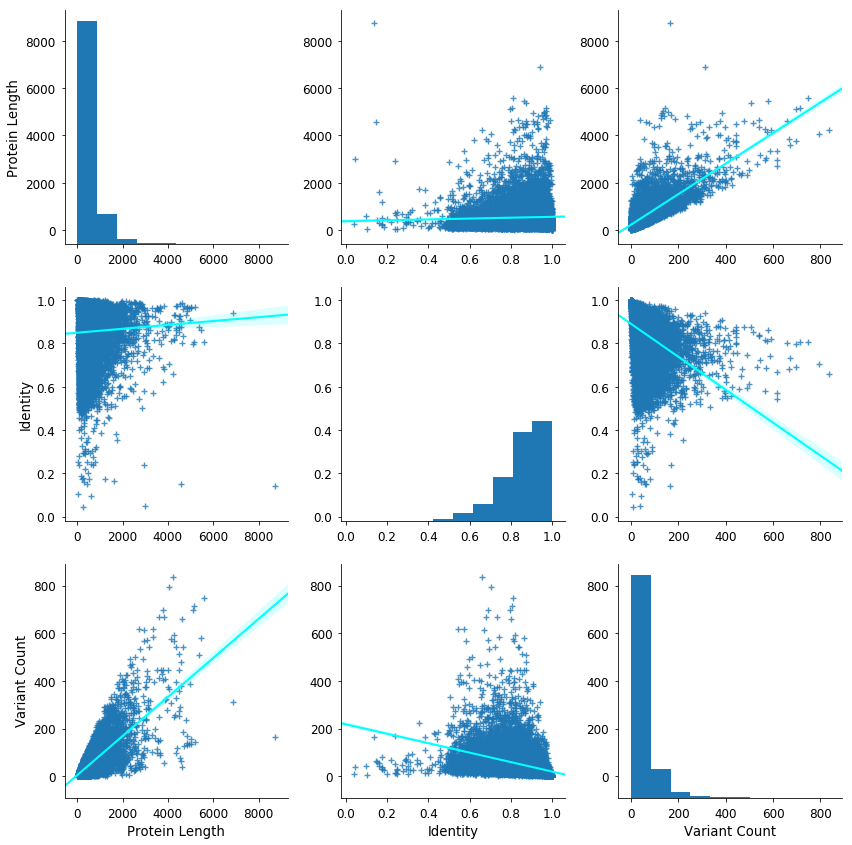

In [53]:
ndf = df_all_anno[df_all_anno['Orthologous species'] == 'Mus_musculus'][['Start', 'End', 'Jaculus_jaculus protein', 'Protein Length', 'Identity']].drop_duplicates()
ndf.set_index(ndf['Jaculus_jaculus protein'], inplace=True)
ndf['Variant Count'] = ndf['Jaculus_jaculus protein'].value_counts()
gdf = ndf[['Protein Length', 'Identity', 'Variant Count']].drop_duplicates()
sns.set_context('paper', font_scale=1.5)
sns.pairplot(gdf, markers="+", kind="reg", size=4, plot_kws={'line_kws':{'color':'cyan'}})
g = sns.jointplot(x='Position%', y='Variant Length', data=var_features.sample(100000), ylim=[0, 1000])

In [3]:
text = """Max PROVEAN score: {max:8.2f}
99% PROVEAN score: {_99:8.2f} 
75% PROVEAN score: {_75:8.2f}
50% PROVEAN score: {_50:8.2f}
25% PROVEAN score: {_25:8.2f}
 5% PROVEAN score: {_5:8.2f}
 1% PROVEAN score: {_1:8.2f}
Min PROVEAN score: {min:8.2f}""".format(
    max=df['Provean'].max(), _99=df['Provean'].quantile(0.99),
    _75=df['Provean'].quantile(0.75), _50=df['Provean'].quantile(0.5),
    _25=df['Provean'].quantile(0.25), _5=df['Provean'].quantile(0.05),
    _1=df['Provean'].quantile(0.01), min=df['Provean'].min())
print(text)
data = [go.Histogram(x=df['Provean'].sample(100000).tolist(), histnorm='percent')]
layout = go.Layout(xaxis=dict(range=[-20, 20], title='PROVEAN Score'), yaxis=dict(title='Percentage %'))
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic histogram')

Max PROVEAN score: 11067.39
99% PROVEAN score:     8.80 
75% PROVEAN score:     0.69
50% PROVEAN score:    -0.12
25% PROVEAN score:    -1.04
 5% PROVEAN score:    -4.40
 1% PROVEAN score:   -29.99
Min PROVEAN score: -6490.69


In [56]:
small_df = df[(df['Identity'] > 0.8) & (df['Provean'] < -5)]
small_df.shape

(112635, 10)

In [57]:
def f(x):
    return pd.Series(dict(Identity = ':'.join(map(lambda i: '%.3f' % i, x['Identity'].tolist())),
                          Orthologous_protein = ':'.join(x['Orthologous protein'].tolist()), 
                          PROVEAN = x['Provean'].min()))

merged_df = small_df.groupby(['Jaculus_jaculus protein', 'Start', 'End', 'Ref', 'Alt']).apply(f)
small_df = merged_df.reset_index()
small_df.head(5)

,Jaculus_jaculus protein,Start,End,Ref,Alt,Identity,Orthologous_protein,PROVEAN
0,ENSJJAP00000000001,167,168,YS,TT,0.802,ENSMUSP00000080991,-5.965
1,ENSJJAP00000000003,23,23,A,G,0.951:0.944:0.947:0.957:0.949,ENSMUSP00000080993:ENSRNOP00000039048:ENSMAUP0...,-5.527
2,ENSJJAP00000000003,483,484,TS,LY,0.957,ENSMOCP00000000003,-5.096
3,ENSJJAP00000000006,24,26,VAM,IMF,0.832,ENSCGRP00000000006,-5.998
4,ENSJJAP00000000006,88,88,S,L,0.805:0.832:0.810,ENSMAUP00000000006:ENSCGRP00000000006:ENSMOCP0...,-5.305


In [65]:
# add rich info
gene_info_df = pd.read_table('/Users/hq/Documents/data/jerboa/ortho_total.tsv')
jerboa_fasta_dict = SeqIO.to_dict(SeqIO.parse('/Users/hq/Documents/data/jerboa/Jaculus_jaculus.JacJac1.0.pep.all.fa', "fasta"),
                                  key_function=lambda i: i.id.split('.')[0])
def get_protein_length(gene_id, fasta_dict=jerboa_fasta_dict):
    return len(fasta_dict[gene_id])
remained_gene_list = small_df['Jaculus_jaculus protein'].unique().tolist()

sub_info_df = gene_info_df[['Gene stable ID', 'Protein stable ID', 'Gene name']]
id_dict = sub_info_df.to_dict('split')
gene_info_list = []
for gene_id, pid, name in id_dict['data']:
    if isinstance(pid, str):
        pid_list = [i for i in pid.split('|') if i in remained_gene_list]
        if len(pid_list) == 1:
            length = get_protein_length(pid_list[0])
            gene_info_list.append(pid_list + [gene_id, name, length])
gene_df = pd.DataFrame(gene_info_list, 
                       columns=['Jaculus_jaculus protein', 'Jaculus_jaculus gene',
                                'Jaculus_jaculus name', 'Protein Length'])
print(small_df.shape)
anno_df = small_df.merge(gene_df, on='Jaculus_jaculus protein')
anno_df.head()

(47113, 8)


,Jaculus_jaculus protein,Start,End,Ref,Alt,Identity,Orthologous_protein,PROVEAN,Jaculus_jaculus gene,Jaculus_jaculus name,Protein Length
0,ENSJJAP00000000001,167,168,YS,TT,0.802,ENSMUSP00000080991,-5.965,ENSJJAG00000000006,NADH1,318
1,ENSJJAP00000000003,23,23,A,G,0.951:0.944:0.947:0.957:0.949,ENSMUSP00000080993:ENSRNOP00000039048:ENSMAUP0...,-5.527,ENSJJAG00000000016,COI,514
2,ENSJJAP00000000003,483,484,TS,LY,0.957,ENSMOCP00000000003,-5.096,ENSJJAG00000000016,COI,514
3,ENSJJAP00000000006,24,26,VAM,IMF,0.832,ENSCGRP00000000006,-5.998,ENSJJAG00000000022,ATP6,226
4,ENSJJAP00000000006,88,88,S,L,0.805:0.832:0.810,ENSMAUP00000000006:ENSCGRP00000000006:ENSMOCP0...,-5.305,ENSJJAG00000000022,ATP6,226


In [66]:
trace1 = go.Histogram(x=(anno_df['Start'] * 100 / anno_df['Protein Length']).tolist(), histnorm='percent', autobinx=False, xbins=dict(start=0, end=100, size=1))
trace2 = go.Histogram(x=(anno_df['End'] * 100 / anno_df['Protein Length']).tolist(), histnorm='percent', autobinx=False, xbins=dict(start=0, end=100, size=1))

fig = tools.make_subplots(rows=1, cols=2, subplot_titles=('Variants Start at % of the Protein Length', 'Variants End at % of the Protein Length'))
fig['layout'].update(yaxis1={'range': [0, 5], 'title': 'Percentage %'}, yaxis2={'range': [0, 5]}, showlegend=False,
                     xaxis1={'title': 'Full Length %'}, xaxis2={'title': 'Full Length %'})
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)

py.offline.iplot(fig, filename='basic histogram')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



In [69]:
def true_pos2msa_pos(msa_seq, query_true_pos):
    pos_count = 0
    query_pos = 0
    true_pos_list = []
    for i in range(len(msa_seq)):
        if msa_seq[i] != '-':
            pos_count += 1
        if pos_count == query_true_pos:
            query_pos = i
        true_pos_list.append(pos_count)
    return query_pos, true_pos_list

n = 0
def identitcal_aln(var, aln_dir='/Users/hq/Documents/src/kimlab/aln'):
    global n
    n += 1
    if n%1000 == 0:
        print(n)
    
    gene = var['Jaculus_jaculus gene']
    protein = var['Jaculus_jaculus protein']
    start = var['Start']
    end = var['End']
    ref = var['Ref']
    alt = var['Alt']
    
    jj_aln = AlignIO.read(open(os.path.join(aln_dir, '%s.aln') % gene), format='clustal')
    seq_id_list = [i.id.split('.')[0] for i in jj_aln._records]
    jj_aln_idx = seq_id_list.index(protein)
    jj_pos, true_pos_list = true_pos2msa_pos(jj_aln[jj_aln_idx], start)
    real_start = true_pos_list.index(var['Start'])
    real_end = len(true_pos_list) - true_pos_list[::-1].index(var['End'])
    mut_part = jj_aln[:, real_start : real_end]
    
    jj_seq = mut_part[jj_aln_idx]._seq
    identi_count = 0
    for i in range(len(seq_id_list)):
        if mut_part[i]._seq == jj_seq:
            identi_count += 1
    if identi_count > 1:
        return False
    else:
        return True

anno_df['Variant Length'] = list(map(lambda i: max(i), zip(anno_df['Ref'].apply(len), anno_df['Alt'].apply(len))))
anno_df['Length to End'] = anno_df['Protein Length'] - anno_df['End']
anno_df['Max Identity'] = anno_df['Identity'].apply(lambda i: max(list(map(float, i.split(':')))))
anno_df = anno_df[(anno_df['Start'] > 3) & (anno_df['Length to End'] > 3) & \
                  (anno_df['Variant Length'] < 15) & \
                  (anno_df['PROVEAN'] > -60) & (anno_df['PROVEAN'] < -5) & \
                  (anno_df['Max Identity'] > 0.8)]
print(anno_df.shape)    
anno_df['Unique'] = anno_df[['Jaculus_jaculus gene', 'Jaculus_jaculus protein', 'Start', 'End', 'Ref', 'Alt']].apply(identitcal_aln, axis=1)
anno_df = anno_df[anno_df['Unique']]

anno_df.to_csv('/Users/hq/Documents/data/jerboa/total_var.filtered.tsv', sep='\t', index=False)
print(anno_df.shape)
anno_df.head()

(23070, 15)
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
(23070, 15)


,Jaculus_jaculus protein,Start,End,Ref,Alt,Identity,Orthologous_protein,PROVEAN,Jaculus_jaculus gene,Jaculus_jaculus name,Protein Length,Length to End,Unique,Variant Length,Max Identity
0,ENSJJAP00000000001,167,168,YS,TT,0.802,ENSMUSP00000080991,-5.965,ENSJJAG00000000006,NADH1,318,150,True,2,0.802
1,ENSJJAP00000000003,23,23,A,G,0.951:0.944:0.947:0.957:0.949,ENSMUSP00000080993:ENSRNOP00000039048:ENSMAUP0...,-5.527,ENSJJAG00000000016,COI,514,491,True,1,0.957
2,ENSJJAP00000000003,483,484,TS,LY,0.957,ENSMOCP00000000003,-5.096,ENSJJAG00000000016,COI,514,30,True,2,0.957
3,ENSJJAP00000000006,24,26,VAM,IMF,0.832,ENSCGRP00000000006,-5.998,ENSJJAG00000000022,ATP6,226,200,True,3,0.832
4,ENSJJAP00000000006,88,88,S,L,0.805:0.832:0.810,ENSMAUP00000000006:ENSCGRP00000000006:ENSMOCP0...,-5.305,ENSJJAG00000000022,ATP6,226,138,True,1,0.832
